# EDA (Exploratory Data Analysis)

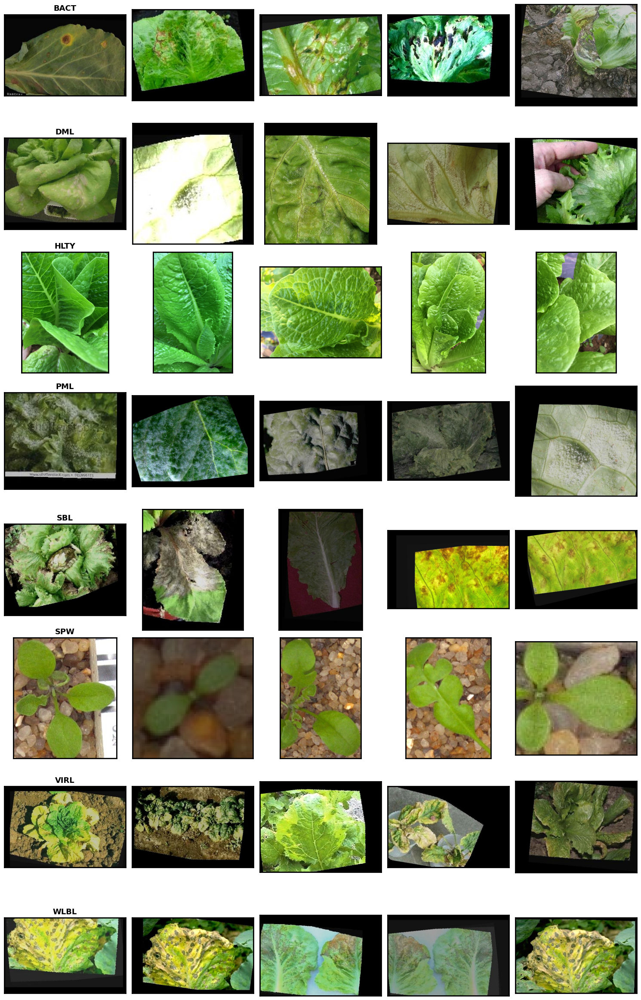

In [2]:
import os
import matplotlib.pyplot as plt
import random


def plot_class_samples(dataset_dir, n_images=5):

    class_folders = [
        d
        for d in os.listdir(dataset_dir)
        if os.path.isdir(os.path.join(dataset_dir, d))
    ]
    class_folders.sort()

    n_classes = len(class_folders)

    fig, axes = plt.subplots(n_classes, n_images, figsize=(n_images * 3, n_classes * 3))

    for row, class_name in enumerate(class_folders):

        class_path = os.path.join(dataset_dir, class_name)

        images = [
            f
            for f in os.listdir(class_path)
            if os.path.isfile(os.path.join(class_path, f))
        ]

        sample_imgs = random.sample(images, min(n_images, len(images)))

        for col in range(n_images):

            ax = axes[row, col] if n_classes > 1 else axes[col]

            ax.set_xticks([])

            ax.set_yticks([])

            # Draw border for clarity

            for spine in ax.spines.values():

                spine.set_edgecolor("black")

                spine.set_linewidth(2)

            if col < len(sample_imgs):

                img_path = os.path.join(class_path, sample_imgs[col])

                img = plt.imread(img_path)

                ax.imshow(img)

                if col == 0:

                    ax.set_title(f"{class_name}", fontsize=13, fontweight="bold")

            else:

                ax.axis("off")

    plt.tight_layout()

    plt.show()


# Example usage:
plot_class_samples(
    r"F:\Lettuce_leaf_classification\Lettuce_disease_datasets", n_images=5
)

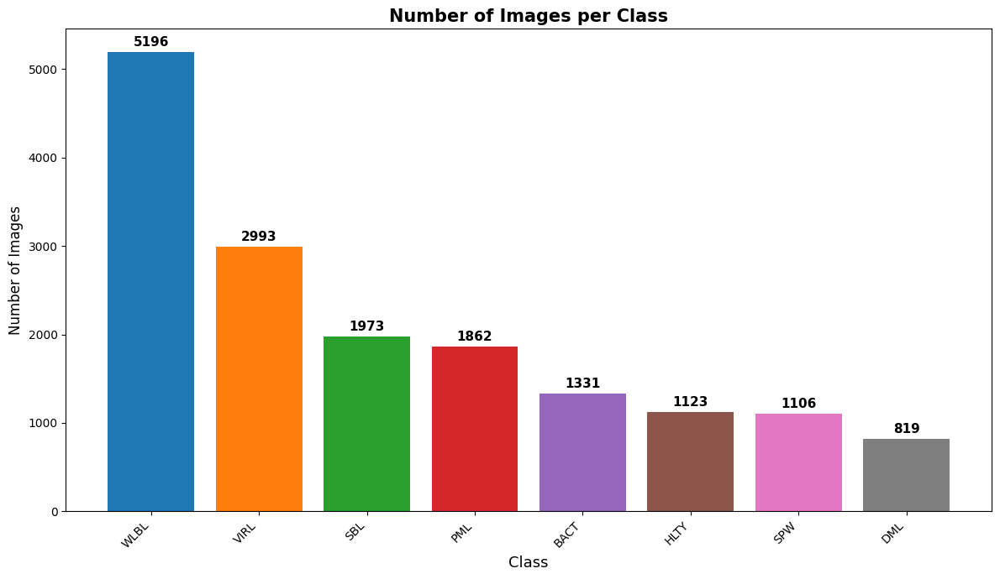

,Class,Image Count
0,WLBL,5196
1,VIRL,2993
2,SBL,1973
3,PML,1862
4,BACT,1331
5,HLTY,1123
6,SPW,1106
7,DML,819


In [3]:
import os
import pandas as pd


import matplotlib.pyplot as plt
import seaborn as sns


from IPython.display import display, Markdown


def plot_image_counts(dataset_dir):
    """








    Visualize the number of images in each class folder as a barplot (descending order),








    and display a DataFrame with the counts. Adds count labels on bars.
    """

    class_folders = [
        d
        for d in os.listdir(dataset_dir)
        if os.path.isdir(os.path.join(dataset_dir, d))
    ]
    class_folders.sort()

    counts = []

    for class_name in class_folders:

        class_path = os.path.join(dataset_dir, class_name)
        n_images = len(
            [
                f
                for f in os.listdir(class_path)
                if os.path.isfile(os.path.join(class_path, f))
            ]
        )
        counts.append(n_images)

    # Create DataFrame and sort descending

    df = pd.DataFrame({"Class": class_folders, "Image Count": counts})

    df = df.sort_values("Image Count", ascending=False).reset_index(drop=True)

    # Plot

    plt.figure(figsize=(12, 7))

    palette = sns.color_palette("tab10", n_colors=len(df))

    bars = plt.bar(df["Class"], df["Image Count"], color=palette)

    plt.xlabel("Class", fontsize=13)

    plt.ylabel("Number of Images", fontsize=12)

    plt.title("Number of Images per Class", fontsize=15, fontweight="bold")

    plt.xticks(rotation=45, ha="right")

    # Add count labels on top of bars

    for bar in bars:
        height = bar.get_height()
        plt.annotate(
            f"{int(height)}",
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=11,
            fontweight="bold",
        )

    plt.tight_layout()

    plt.show()

    display(df)


# Example usage:


plot_image_counts(r"F:\Lettuce_leaf_classification\Lettuce_disease_datasets")

### RGB Intensity Visualization 

### Image Size 240x240 

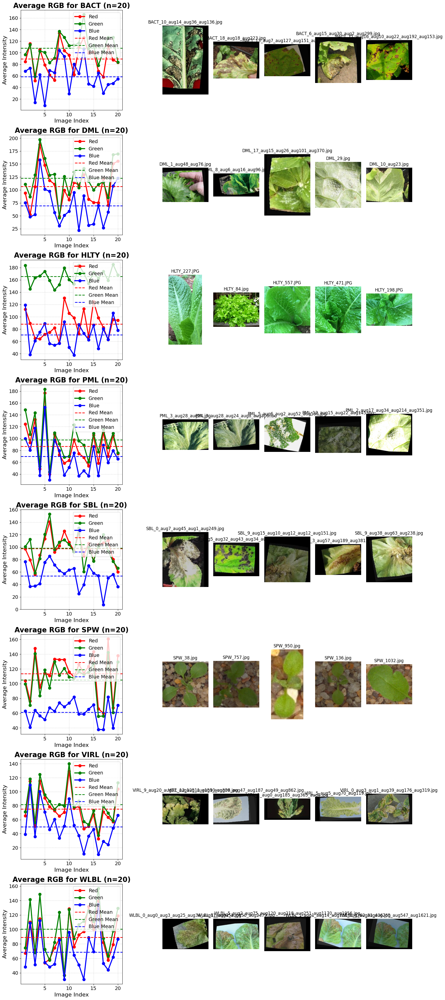

In [4]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


def compute_avg_rgb(images):
    avg_r, avg_g, avg_b = [], [], []
    for img_path in images:
        img = cv2.imread(img_path)
        if img is None:
            continue
        img = cv2.resize(img, (240, 240))
        b, g, r = cv2.split(img)
        avg_r.append(np.mean(r))
        avg_g.append(np.mean(g))
        avg_b.append(np.mean(b))
    return avg_r, avg_g, avg_b


# Path to dataset
dataset_path = r"F:\Lettuce_leaf_classification\Lettuce_disease_datasets"
class_folders = [
    d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))
]
class_folders.sort()

n_classes = len(class_folders)
n_img_display = 5  # Number of images to show per class on the right
fig_height = n_classes * 5  # Fixed height per class row
fig_width = 18  # Fixed width for all
fig, axes = plt.subplots(
    n_classes,
    2,
    figsize=(fig_width, fig_height),
    gridspec_kw={"width_ratios": [2, n_img_display]},
    squeeze=False,
)

for idx, cls in enumerate(class_folders):
    class_path = os.path.join(dataset_path, cls)
    img_files = [
        os.path.join(class_path, f)
        for f in os.listdir(class_path)
        if os.path.isfile(os.path.join(class_path, f))
    ]
    sample_imgs = img_files if len(img_files) <= 20 else random.sample(img_files, 20)
    r_vals, g_vals, b_vals = compute_avg_rgb(sample_imgs)
    x = list(range(1, len(sample_imgs) + 1))
    ax_rgb = axes[idx, 0]
    # Plot RGB lines
    ax_rgb.plot(
        x, r_vals, color="red", marker="o", linewidth=3, markersize=8, label="Red"
    )
    ax_rgb.plot(
        x, g_vals, color="green", marker="o", linewidth=3, markersize=8, label="Green"
    )
    ax_rgb.plot(
        x, b_vals, color="blue", marker="o", linewidth=3, markersize=8, label="Blue"
    )
    # Plot mean dashed lines
    ax_rgb.axhline(
        np.mean(r_vals), color="red", linestyle="--", linewidth=2, label="Red Mean"
    )
    ax_rgb.axhline(
        np.mean(g_vals), color="green", linestyle="--", linewidth=2, label="Green Mean"
    )
    ax_rgb.axhline(
        np.mean(b_vals), color="blue", linestyle="--", linewidth=2, label="Blue Mean"
    )
    ax_rgb.set_title(
        f"Average RGB for {cls} (n={len(sample_imgs)})", fontsize=20, fontweight="bold"
    )
    ax_rgb.set_xlabel("Image Index", fontsize=16)
    ax_rgb.set_ylabel("Average Intensity", fontsize=16)
    ax_rgb.legend(fontsize=14, loc="upper right")
    ax_rgb.tick_params(axis="both", labelsize=14)
    ax_rgb.grid(True, linestyle="--", alpha=0.5)
    # Show images on the right
    ax_img_grid = axes[idx, 1]
    ax_img_grid.axis("off")
    for j in range(min(n_img_display, len(sample_imgs))):
        img = cv2.imread(sample_imgs[j])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Place images horizontally within the right subplot using inset axes
        left = j / n_img_display + 0.01
        width = 0.18
        bottom = 0.15
        height = 0.7
        ax_inset = ax_img_grid.inset_axes([left, bottom, width, height])
        ax_inset.imshow(img)
        ax_inset.axis("off")
        ax_inset.set_title(os.path.basename(sample_imgs[j]), fontsize=12)

plt.tight_layout()
plt.show()

### Image Size 640x640

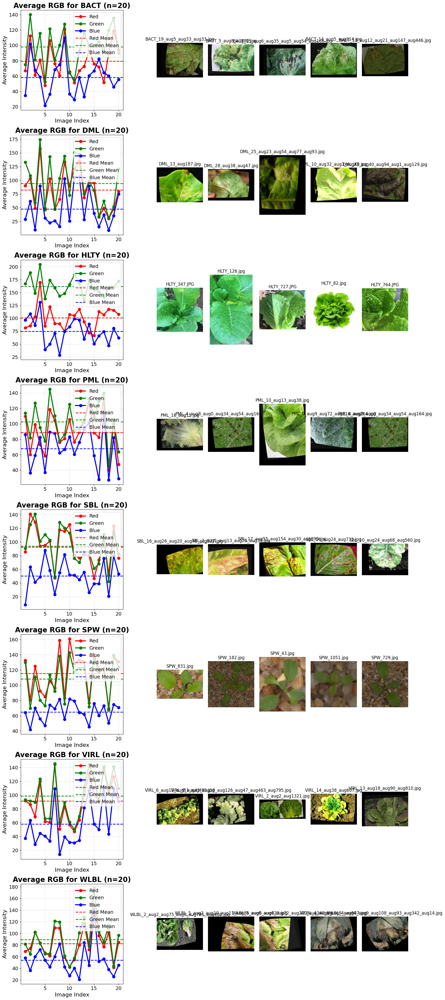

In [5]:
def compute_avg_rgb(images):
    avg_r, avg_g, avg_b = [], [], []
    for img_path in images:
        img = cv2.imread(img_path)
        if img is None:
            continue
        img = cv2.resize(img, (640, 640))
        b, g, r = cv2.split(img)
        avg_r.append(np.mean(r))
        avg_g.append(np.mean(g))
        avg_b.append(np.mean(b))
    return avg_r, avg_g, avg_b


# Path to dataset
dataset_path = r"F:\Lettuce_leaf_classification\Lettuce_disease_datasets"
class_folders = [
    d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))
]
class_folders.sort()

n_classes = len(class_folders)
n_img_display = 5  # Number of images to show per class on the right
fig_height = n_classes * 5  # Fixed height per class row
fig_width = 18  # Fixed width for all
fig, axes = plt.subplots(
    n_classes,
    2,
    figsize=(fig_width, fig_height),
    gridspec_kw={"width_ratios": [2, n_img_display]},
    squeeze=False,
)

for idx, cls in enumerate(class_folders):
    class_path = os.path.join(dataset_path, cls)
    img_files = [
        os.path.join(class_path, f)
        for f in os.listdir(class_path)
        if os.path.isfile(os.path.join(class_path, f))
    ]
    sample_imgs = img_files if len(img_files) <= 20 else random.sample(img_files, 20)
    r_vals, g_vals, b_vals = compute_avg_rgb(sample_imgs)
    x = list(range(1, len(sample_imgs) + 1))
    ax_rgb = axes[idx, 0]
    # Plot RGB lines
    ax_rgb.plot(
        x, r_vals, color="red", marker="o", linewidth=3, markersize=8, label="Red"
    )
    ax_rgb.plot(
        x, g_vals, color="green", marker="o", linewidth=3, markersize=8, label="Green"
    )
    ax_rgb.plot(
        x, b_vals, color="blue", marker="o", linewidth=3, markersize=8, label="Blue"
    )
    # Plot mean dashed lines
    ax_rgb.axhline(
        np.mean(r_vals), color="red", linestyle="--", linewidth=2, label="Red Mean"
    )
    ax_rgb.axhline(
        np.mean(g_vals), color="green", linestyle="--", linewidth=2, label="Green Mean"
    )
    ax_rgb.axhline(
        np.mean(b_vals), color="blue", linestyle="--", linewidth=2, label="Blue Mean"
    )
    ax_rgb.set_title(
        f"Average RGB for {cls} (n={len(sample_imgs)})", fontsize=20, fontweight="bold"
    )
    ax_rgb.set_xlabel("Image Index", fontsize=16)
    ax_rgb.set_ylabel("Average Intensity", fontsize=16)
    ax_rgb.legend(fontsize=14, loc="upper right")
    ax_rgb.tick_params(axis="both", labelsize=14)
    ax_rgb.grid(True, linestyle="--", alpha=0.5)
    # Show images on the right
    ax_img_grid = axes[idx, 1]
    ax_img_grid.axis("off")
    for j in range(min(n_img_display, len(sample_imgs))):
        img = cv2.imread(sample_imgs[j])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Place images horizontally within the right subplot using inset axes
        left = j / n_img_display + 0.01
        width = 0.18
        bottom = 0.15
        height = 0.7
        ax_inset = ax_img_grid.inset_axes([left, bottom, width, height])
        ax_inset.imshow(img)
        ax_inset.axis("off")
        ax_inset.set_title(os.path.basename(sample_imgs[j]), fontsize=12)

plt.tight_layout()
plt.show()

### We know that 2D images are made of pixels . These pixels have many format such as RGB, HSV etc .

In Machine vision or Computer Vision tasks , the 3 channel RGB Matrices gives a lot of insightful idea aboout the dataset.

In the previous section "00_data_visualization.ipnb" , we have seen that the images belongs to 8 different classes , having imbalance among the numbers of images as well as their size and resolution.


It becomes extremly important to appropriately resize, orient, augment our data before trying to fit in any classical or Deep Neural Network for Machine Learing operation.

    # here , above we have resized the Random Images (from each folder) by (224x224) and (640x640) pixels having 3 channels RGB.
    # We observe that the overall mean values for different classes remains almost similar even after resizing .
        Observance :
            1: Green Channel mean dominates all other classes's channel .(Except : SPW).
                In case of only SPW , mean of Red channel is more than the mean of Green .
            2: For both the cases, i.e (224x224) and (640x640)------- SBL and SPW ------> The mean for Red and Green Channel are very close to each other.

            Hence , Resizing is not helping a lot in RGB feature extraction.
            But, resizing will play very important role , while fitting the model.



### For Our purpose we will experiment with 2 resizing images 
    # 640 x 640 , as it is very close to the median of all the image size. (But there are plenty of images , whose resolution is far smalleer than 640x640).In that case , resizing the smaller images to 640x640 , will lead to noise and bad quality of images.

    # For smaller images we will also experiment with 224x224

In [6]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from glob import glob
from sklearn.preprocessing import StandardScaler

In [7]:
data_dir = "F:\Lettuce_leaf_classification\Lettuce_disease_datasets"
classes = sorted(os.listdir(data_dir))
class_images = {cls: glob(os.path.join(data_dir, cls, "*.jpg")) for cls in classes}
print(classes)

['BACT', 'DML', 'HLTY', 'PML', 'SBL', 'SPW', 'VIRL', 'WLBL']


In [8]:
import os
import random
import cv2
import matplotlib.pyplot as plt


def resized_gray_scale_images(data_dir, num_images_per_class=5, img_size=(240, 240)):
    """
    Selects `num_images_per_class` random images from each class folder, resizes them to img_size,
    converts to grayscale, and visualizes them.

    Args:
        data_dir (str): Root directory containing class subfolders with images.
        num_images_per_class (int): Number of random images to select per class.
        img_size (tuple): Target image size (width, height).
    """
    class_folders = [
        os.path.join(data_dir, folder)
        for folder in os.listdir(data_dir)
        if os.path.isdir(os.path.join(data_dir, folder))
    ]

    fig, axes = plt.subplots(
        len(class_folders), num_images_per_class, figsize=(15, 2.5 * len(class_folders))
    )
    fig.suptitle(
        "Random Grayscale Images - 5  Images from Each Class\n(Resized to 240x240)",
        fontsize=16,
    )

    for class_idx, class_path in enumerate(class_folders):
        class_name = os.path.basename(class_path)
        image_files = [
            file
            for file in os.listdir(class_path)
            if file.lower().endswith((".png", ".jpg", ".jpeg"))
        ]

        selected_images = random.sample(
            image_files, min(num_images_per_class, len(image_files))
        )

        for img_idx, img_file in enumerate(selected_images):
            img_path = os.path.join(class_path, img_file)
            img = cv2.imread(img_path)
            img_resized = cv2.resize(img, img_size)
            img_gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

            ax = axes[class_idx, img_idx] if len(class_folders) > 1 else axes[img_idx]
            ax.imshow(img_gray, cmap="gray")
            ax.set_title(f"{class_name}", fontsize=10)
            ax.axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

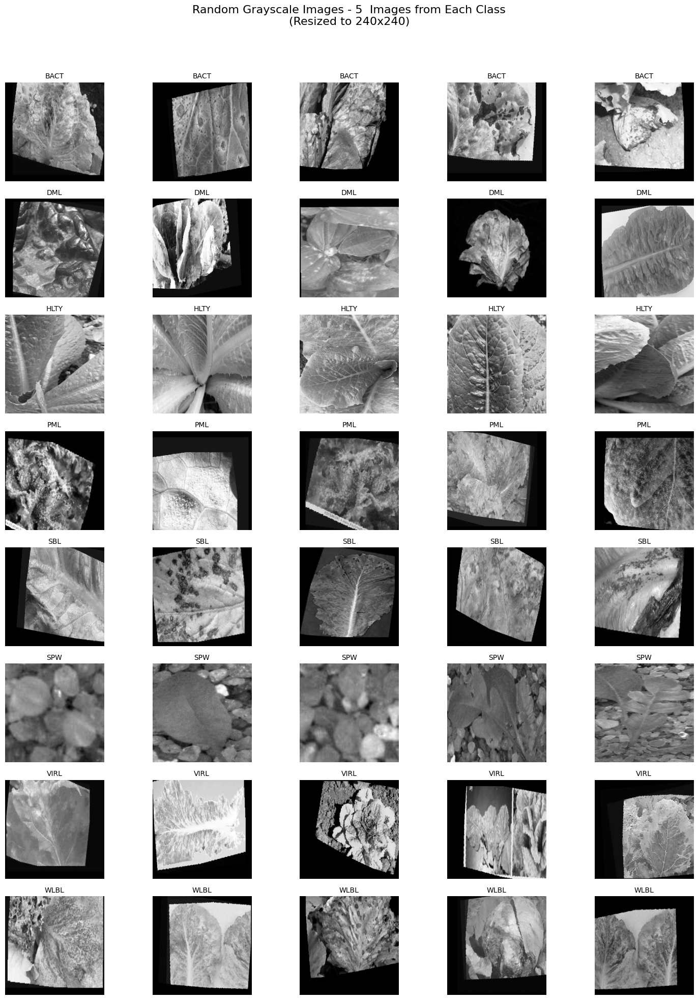

In [9]:
resized_gray_scale_images(data_dir=data_dir)

In [10]:
def compute_brightness(img_path):
    img = cv2.imread(img_path)
    if img is None:
        return 0
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return np.mean(gray)


def extract_texture(img_path):
    img = cv2.imread(img_path)
    if img is None:
        return np.zeros(13)
    gray = cv2.cvtColor(cv2.resize(img, (240, 240)), cv2.COLOR_BGR2GRAY)
    return mahotas.features.haralick(gray).mean(axis=0)


def extract_histogram(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(cv2.resize(img, (240, 240)), cv2.COLOR_BGR2GRAY)
    hist = cv2.calcHist([gray], [0], None, [64], [0, 256])
    return hist.flatten() / hist.sum()

##  Feature Table Illustration : Important

This dataset includes features extracted from grayscale microscopy images for image classification purposes. Below are the details of each column in the feature table:

### 🔹 Column Names:

| Column Name      | Description |
|------------------|-------------|
| `class`          | The biological category of the image (e.g., Bacteria, Virus, Slipper, etc.) |
| `image_name`     | Original filename of the image without extension (e.g., BACT_09, VIRL_17) |
| `brightness`     | Mean brightness value computed from the grayscale image |
| `texture_0` to `texture_23` | Features extracted using Mahotas' texture analysis (e.g., Haralick features, contrast, homogeneity) |
| `hist_0` to `hist_63`       | Pixel intensity histogram features (64 bins from 0 to 255 pixel values) |

---

###  Texture Features

These features are computed using the **Haralick features** extracted via Mahotas. The 24 standard texture features are based on co-occurrence matrices and include:

- Angular Second Moment (ASM)
- Contrast
- Correlation
- Sum of Squares: Variance
- Inverse Difference Moment
- Sum Average
- Sum Variance
- Sum Entropy
- Entropy
- Difference Variance
- Difference Entropy
- Information Measures of Correlation
- Max Correlation Coefficient

Mahotas calculates these across 4 directions (0°, 45°, 90°, 135°) and averages them, resulting in 24 values.

Reference: [Mahotas Haralick Features](https://mahotas.readthedocs.io/en/latest/features.html#mahotas.features.haralick)

---

###  Histogram Features

These represent the normalized pixel distribution across the grayscale image. The pixel intensities (0–255) are binned into 64 bins.

- `hist_0` to `hist_63`: Represents the proportion of pixels in each bin (bin width = 4), e.g.:
  - `hist_0`: 0–3 intensity
  - `hist_1`: 4–7
  - ...
  - `hist_63`: 252–255

These features help represent the **overall distribution of brightness** and are useful in detecting intensity-based patterns across classes.

---

### Feature Modeling to  ML Pipeline

These extracted features (`brightness`, `texture`, `histogram`) serve as structured numerical input for traditional machine learning algorithms (SVM or RandomForest), helping in classification tasks where deep learning may not be feasible due to data limitations.


In [12]:
!pip install mahotas

  Using cached mahotas-1.4.18-cp310-cp310-win_amd64.whl (1.7 MB)


You should consider upgrading via the 'F:\Lettuce_leaf_classification\Lettuce_leaf_classification\leaf_classf\Scripts\python.exe -m pip install --upgrade pip' command.


In [14]:
import os
import pandas as pd
import mahotas

data = []

for label, cls in enumerate(classes):
    for path in class_images[cls][:]:  # Loop over all images for each class
        image_name = os.path.splitext(os.path.basename(path))[
            0
        ]  # Extract image name without extension
        brightness = compute_brightness(path)
        texture = extract_texture(path)
        histogram = extract_histogram(path)

        row = {
            "class": cls,
            "image_name": image_name,
            "brightness": brightness,
        }

        for i, t in enumerate(texture):
            row[f"texture_{i}"] = t

        for i, h in enumerate(histogram):
            row[f"hist_{i}"] = h

        data.append(row)

df = pd.DataFrame(data)
df

,class,image_name,brightness,texture_0,texture_1,texture_2,texture_3,texture_4,texture_5,texture_6,...,hist_54,hist_55,hist_56,hist_57,hist_58,hist_59,hist_60,hist_61,hist_62,hist_63
0,BACT,BACT_0,105.681213,0.000213,179.414974,0.961457,2327.073882,0.162140,211.321734,9128.880553,...,0.002378,0.002118,0.001198,0.001111,0.000486,0.000278,0.000069,0.000017,0.0,0.0
1,BACT,BACT_0_aug123,88.295277,0.001049,151.278399,0.968157,2376.693813,0.216847,177.005691,9355.496853,...,0.000017,0.000035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
2,BACT,BACT_0_aug123_aug287,67.870191,0.001271,85.716734,0.969409,1402.435931,0.271734,136.151913,5524.026989,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
3,BACT,BACT_0_aug123_aug287_aug224,68.494489,0.002770,83.977155,0.974685,1659.949657,0.298142,137.425923,6555.821472,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
4,BACT,BACT_0_aug123_aug51,88.760596,0.006908,175.846622,0.969769,2909.561422,0.245007,178.056804,11462.399067,...,0.000608,0.000260,0.000122,0.000035,0.000017,0.000000,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16397,WLBL,WLBL_5_aug8_aug93_aug84_aug1166_aug2067,71.854339,0.048899,230.280581,0.971510,4041.782501,0.356626,144.300583,15936.849421,...,0.000469,0.000208,0.000017,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
16398,WLBL,WLBL_5_aug8_aug93_aug84_aug417,62.126874,0.021831,96.525398,0.976201,2028.594608,0.378961,124.548319,8017.853033,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
16399,WLBL,WLBL_5_aug8_aug93_aug84_aug75,62.970498,0.026987,81.244614,0.981918,2247.371154,0.405047,126.009205,8908.240001,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
16400,WLBL,WLBL_5_aug8_aug93_aug84_aug75_aug1123,53.016534,0.027986,44.439837,0.984145,1401.925811,0.469803,106.092712,5563.263405,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0


In [ ]:
df.columns

Index(['class', 'image_name', 'brightness', 'texture_0', 'texture_1',
       'texture_2', 'texture_3', 'texture_4', 'texture_5', 'texture_6',
       'texture_7', 'texture_8', 'texture_9', 'texture_10', 'texture_11',
       'texture_12', 'hist_0', 'hist_1', 'hist_2', 'hist_3', 'hist_4',
       'hist_5', 'hist_6', 'hist_7', 'hist_8', 'hist_9', 'hist_10', 'hist_11',
       'hist_12', 'hist_13', 'hist_14', 'hist_15', 'hist_16', 'hist_17',
       'hist_18', 'hist_19', 'hist_20', 'hist_21', 'hist_22', 'hist_23',
       'hist_24', 'hist_25', 'hist_26', 'hist_27', 'hist_28', 'hist_29',
       'hist_30', 'hist_31', 'hist_32', 'hist_33', 'hist_34', 'hist_35',
       'hist_36', 'hist_37', 'hist_38', 'hist_39', 'hist_40', 'hist_41',
       'hist_42', 'hist_43', 'hist_44', 'hist_45', 'hist_46', 'hist_47',
       'hist_48', 'hist_49', 'hist_50', 'hist_51', 'hist_52', 'hist_53',
       'hist_54', 'hist_55', 'hist_56', 'hist_57', 'hist_58', 'hist_59',
       'hist_60', 'hist_61', 'hist_62', 'hist_63']

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
brightness,2336.0,122.025034,24.077460,0.000000,112.610081,126.155019,137.381124,195.224322
texture_0,2336.0,0.001440,0.021223,0.000064,0.000202,0.000358,0.000951,1.000000
texture_1,2336.0,198.997063,160.367767,0.000000,57.898107,175.800455,303.287179,1864.415427
texture_2,2336.0,0.929001,0.048077,0.460556,0.900927,0.935684,0.966173,1.000000
texture_3,2336.0,1404.364960,851.431675,0.000000,706.914808,1366.675273,1913.661552,7063.930232
...,...,...,...,...,...,...,...,...
hist_59,2336.0,0.001690,0.003247,0.000000,0.000000,0.000417,0.002036,0.049479
hist_60,2336.0,0.001383,0.007325,0.000000,0.000000,0.000208,0.001354,0.330712
hist_61,2336.0,0.000861,0.002082,0.000000,0.000000,0.000052,0.000868,0.039340
hist_62,2336.0,0.000754,0.002201,0.000000,0.000000,0.000000,0.000382,0.039670


## Data Intrepretation :



### Lets Visualize the Distribution of Brightness across distinct classes :
    # This will help us understand , 
        What is the distribution of brightness in GrayScale when mapped from RGB.
        Comparision for Distribution of brightness across different classes. 

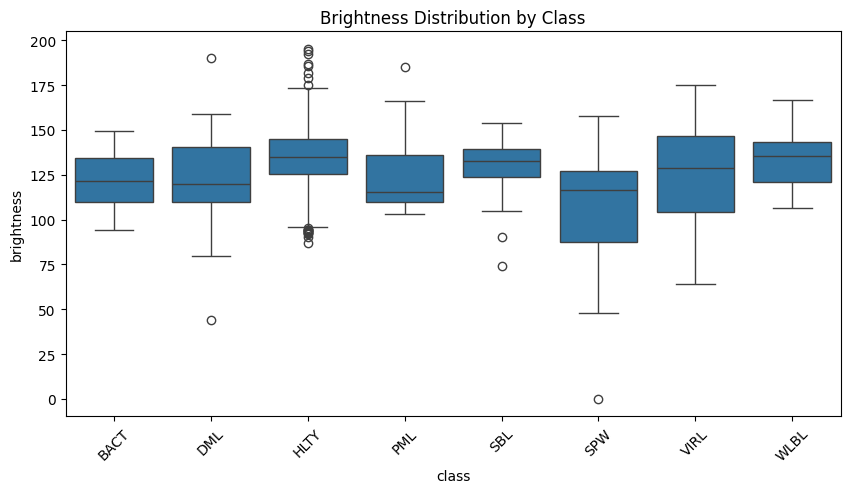

In [ ]:
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x="class", y="brightness")
plt.title("Brightness Distribution by Class")
plt.xticks(rotation=45)
plt.show()

C:\Users\amans\AppData\Local\Temp\ipykernel_19260\2228294921.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x="class", y="brightness", palette="tab10")


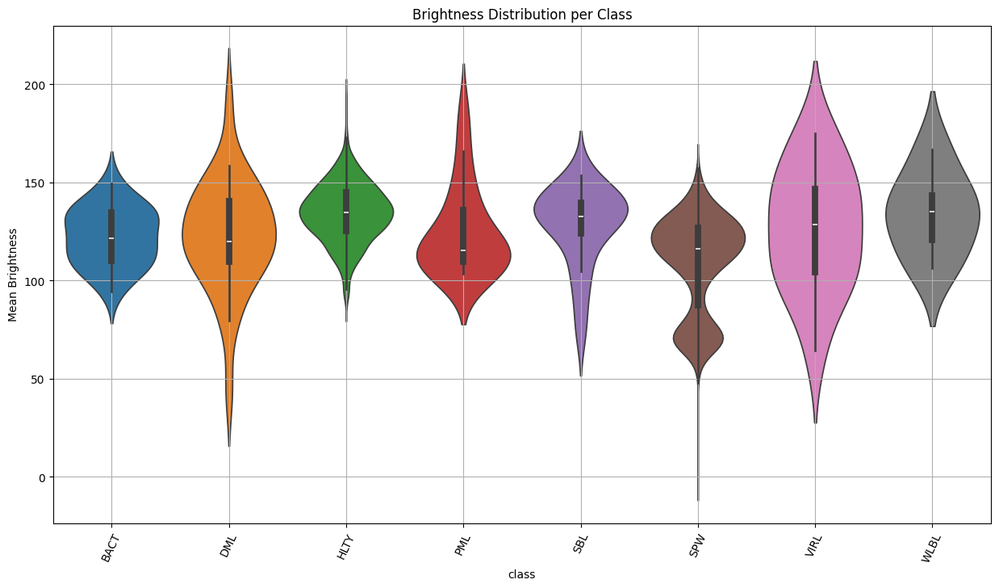

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 8))
sns.violinplot(data=df, x="class", y="brightness", palette="tab10")
plt.title("Brightness Distribution per Class")
plt.xticks(rotation=65)
plt.ylabel("Mean Brightness")
plt.grid(True)
plt.show()

### We can see from above violoin plot that the distribution of Mean brightness for "SPW" class is skewed . While rest of the classes , almost showing symmetric mean brightness distribution .


### Hence this Mean brightness feature will significantly help the model to learn.

## Lets take a look at the distribution of texture features

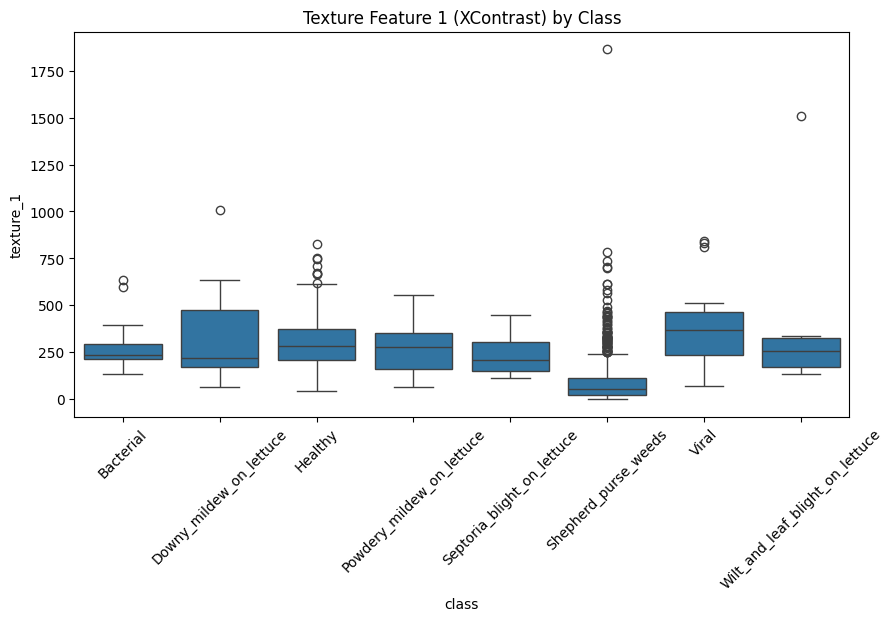

In [ ]:
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x="class", y="texture_1")
plt.title("Texture Feature 1 (XContrast) by Class")
plt.xticks(rotation=45)
plt.show()

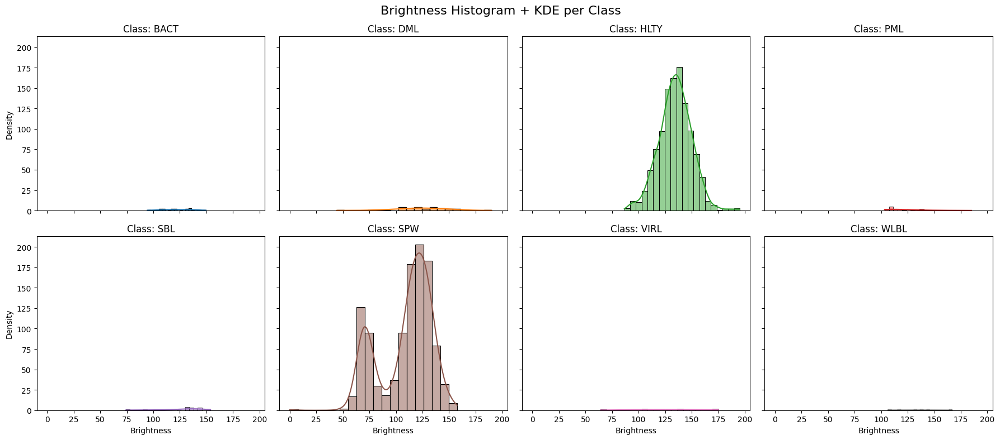

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharex=True, sharey=True)
axes = axes.flatten()

for i, cls in enumerate(df["class"].unique()):
    sns.histplot(
        data=df[df["class"] == cls],
        x="brightness",
        bins=20,
        kde=True,
        ax=axes[i],
        color=sns.color_palette("tab10")[i],
        edgecolor="black",
    )
    axes[i].set_title(f"Class: {cls}")
    axes[i].set_xlabel("Brightness")
    axes[i].set_ylabel("Density")

plt.suptitle("Brightness Histogram + KDE per Class", fontsize=16)
plt.tight_layout()
plt.show()

### Because of class imbalance

##  Feature Visualization : 

### 🧪 Texture Features
These features are derived from Haralick texture metrics calculated on grayscale images. Each represents a specific statistical property of texture:
- `texture_0` = Contrast
- `texture_1` = Dissimilarity
- `texture_2` = Homogeneity
- `texture_3` = Energy
- `texture_4` = Correlation
- `texture_5` = ASM (Angular Second Moment)
- `texture_6` = Entropy
- `texture_7` to `texture_12` = Additional statistical features like sum of variances, difference variance, etc.

Each texture feature is visualized:
- As a **boxplot** per class to analyze distribution across leaf health categories.
- As a **histogram** to study overall value distribution and skewness.

---

### 🖼 Histogram Features
These are grayscale intensity values grouped into 16 bins:
- `hist_0` to `hist_15` represent pixel count densities in specific grayscale ranges (e.g., 0-15, 16-31... up to 255).

Each histogram feature is visualized:
- As a **boxplot** grouped by class to observe variation in brightness patterns.
- As a **histogram** to study pixel density distribution across entire dataset.


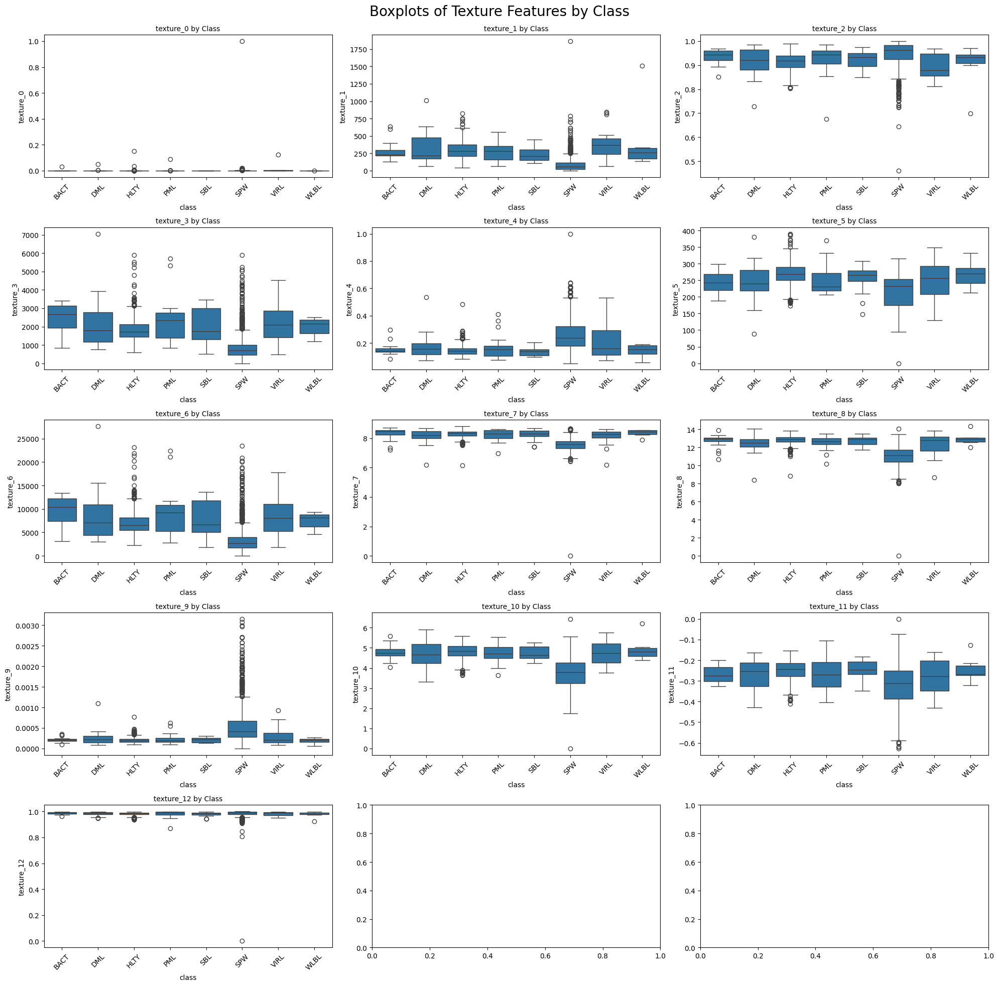

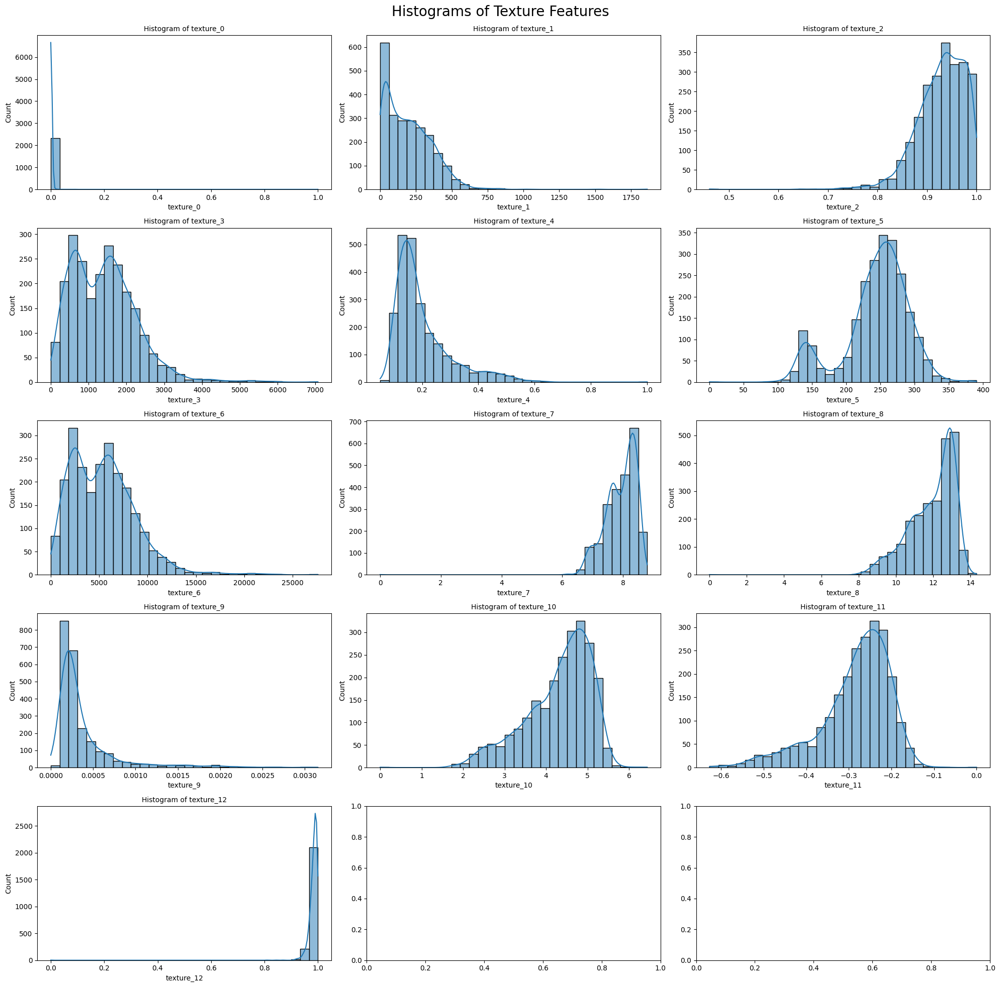

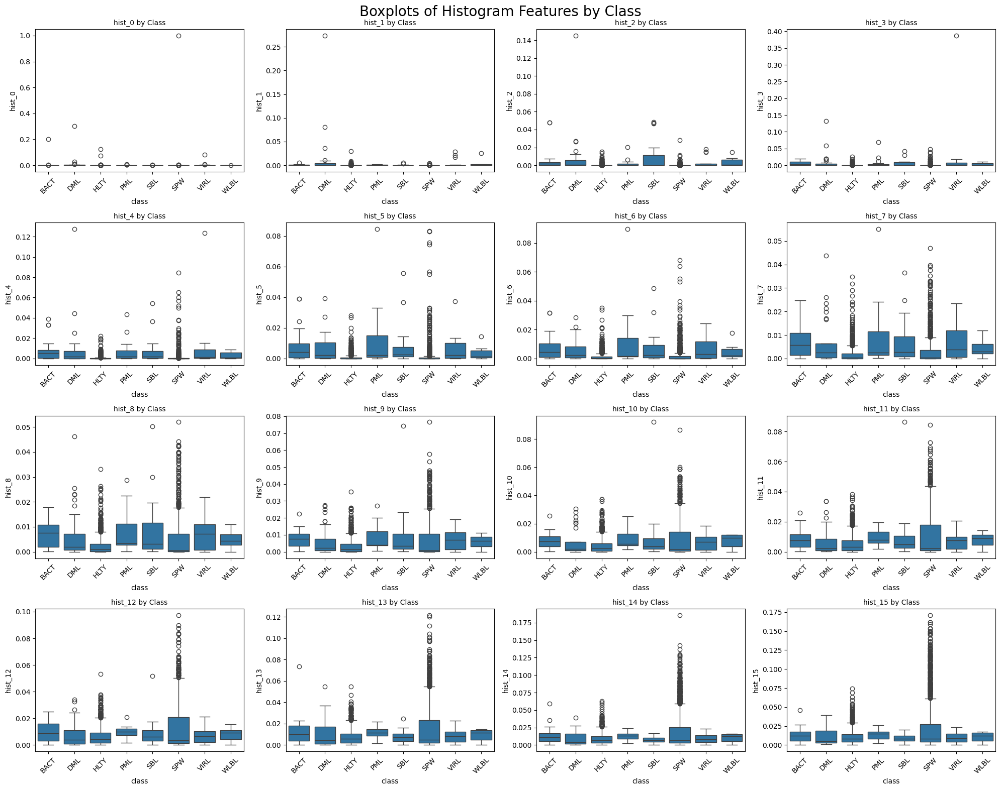

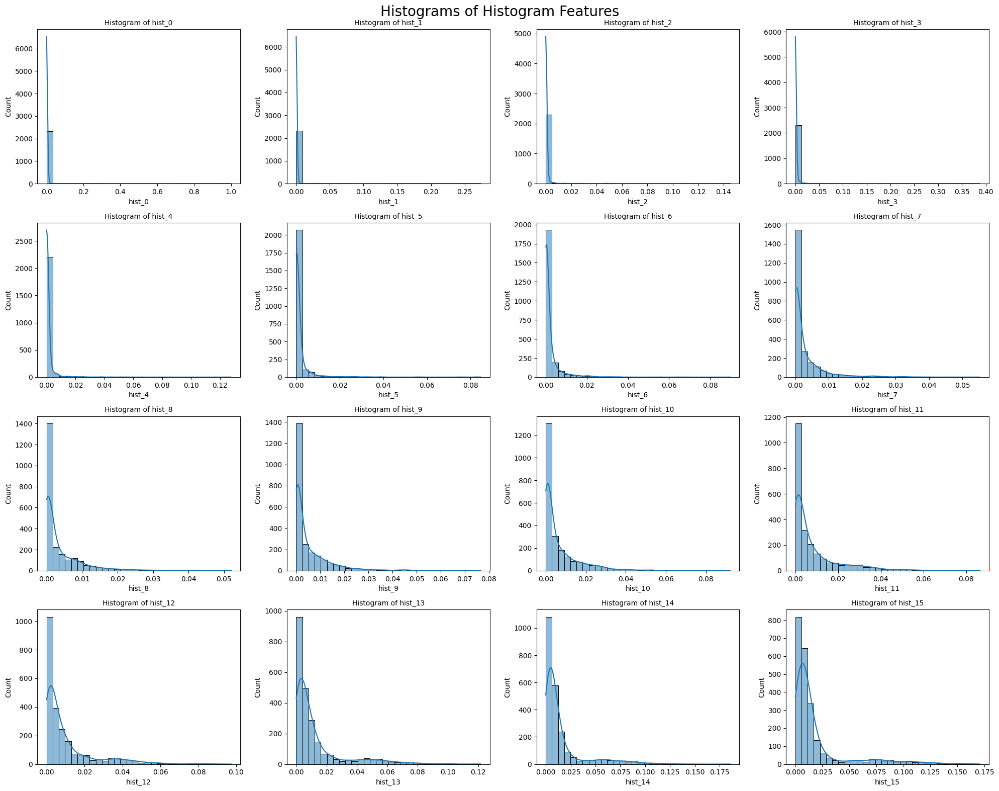

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# ------------ Texture Features -------------
texture_cols = [col for col in df.columns if col.startswith("texture_")]

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(20, 20))
fig.suptitle("Boxplots of Texture Features by Class", fontsize=20)

for ax, col in zip(axes.flatten(), texture_cols):
    sns.boxplot(data=df, x="class", y=col, ax=ax)
    ax.set_title(f"{col} by Class", fontsize=10)
    ax.tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

# ------------ Texture Histograms -------------
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(20, 20))
fig.suptitle("Histograms of Texture Features", fontsize=20)

for ax, col in zip(axes.flatten(), texture_cols):
    sns.histplot(data=df[col], bins=30, kde=True, ax=ax)
    ax.set_title(f"Histogram of {col}", fontsize=10)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

# ------------ Histogram Features -------------
hist_cols = [col for col in df.columns if col.startswith("hist_")]

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 16))
fig.suptitle("Boxplots of Histogram Features by Class", fontsize=20)

for ax, col in zip(axes.flatten(), hist_cols):
    sns.boxplot(data=df, x="class", y=col, ax=ax)
    ax.set_title(f"{col} by Class", fontsize=10)
    ax.tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

# ------------ Histogram Histograms -------------
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 16))
fig.suptitle("Histograms of Histogram Features", fontsize=20)

for ax, col in zip(axes.flatten(), hist_cols):
    sns.histplot(data=df[col], bins=30, kde=True, ax=ax)
    ax.set_title(f"Histogram of {col}", fontsize=10)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2336 entries, 0 to 2335
Data columns (total 80 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   class       2336 non-null   object 
 1   image_name  2336 non-null   object 
 2   brightness  2336 non-null   float64
 3   texture_0   2336 non-null   float64
 4   texture_1   2336 non-null   float64
 5   texture_2   2336 non-null   float64
 6   texture_3   2336 non-null   float64
 7   texture_4   2336 non-null   float64
 8   texture_5   2336 non-null   float64
 9   texture_6   2336 non-null   float64
 10  texture_7   2336 non-null   float64
 11  texture_8   2336 non-null   float64
 12  texture_9   2336 non-null   float64
 13  texture_10  2336 non-null   float64
 14  texture_11  2336 non-null   float64
 15  texture_12  2336 non-null   float64
 16  hist_0      2336 non-null   float32
 17  hist_1      2336 non-null   float32
 18  hist_2      2336 non-null   float32
 19  hist_3      2336 non-null  

### Pairwise Correlation Heatmap
    # This helps to understand how features are linearly co-related.

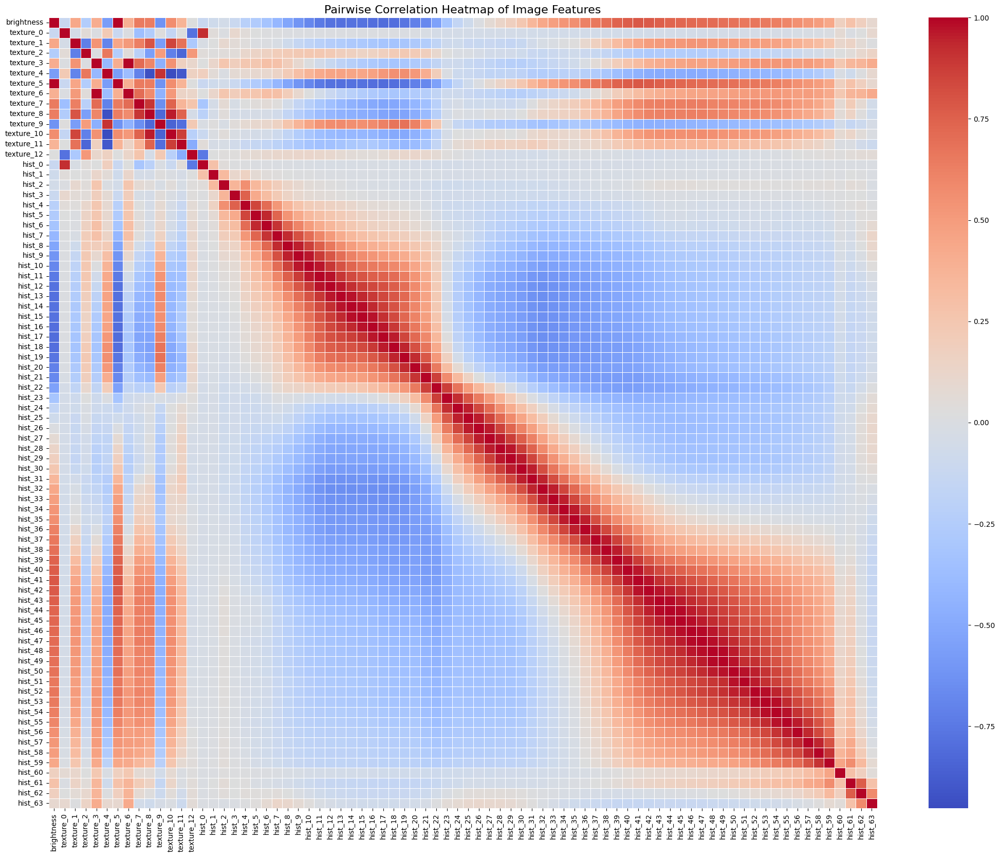

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# we dont need non-numeric or non-feature columns
features_df = df.drop(columns=["class", "image_name"])

# Compute correlation matrix
corr_matrix = features_df.corr()

# Plot heatmap
plt.figure(figsize=(26, 20))
sns.heatmap(corr_matrix, annot=False, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Pairwise Correlation Heatmap of Image Features", fontsize=16)
plt.show()

### Note : We expect high correlation coefficient acorss the principal diagonal of the matrix , this is[represented in dark red ( no need to worry ! )]

### The above heatmap tells us that there is some strong co-rellation among the hist features (specially : in between range hist_40 to hist_59) . Except , this the heatmap clearly showing almost feature independence . (we will move forward with this assumption)

# Dimensionality Check
    ### Using PCA technique
    ### Using t-SNE technique

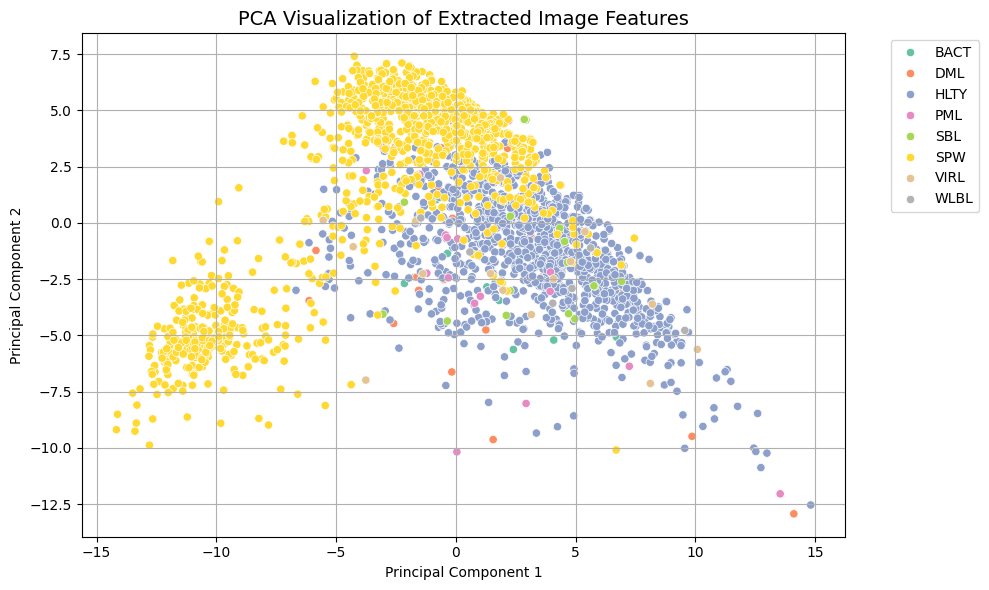

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Normalize features
X = features_df.values
X_scaled = StandardScaler().fit_transform(X)

# Apply PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Add class labels for visualization
df_pca = pd.DataFrame(X_pca, columns=["PC1", "PC2"])
df_pca["class"] = df["class"]

# Plot PCA results
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x="PC1", y="PC2", hue="class", palette="Set2")
plt.title("PCA Visualization of Extracted Image Features", fontsize=14)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# t-SNE (t-distributed Stochastic Neighbor Embedding):
    ----t-SNE ,  visualization is a technique used to represent high-dimensional data in a lower-dimensional space, typically two or three dimensions, for the purpose of visualization. It's a non-linear dimensionality reduction method that excels at preserving the local structure of the data, making it useful for identifying clusters and patterns in complex datasets. 

###
Reduces dimensionality:
    ---# t-SNE takes high-dimensional data (data with many features) and transforms it into a lower-dimensional space (like 2D or 3D). 
Preserves local structure:
Unlike some other dimensionality reduction techniques, t-SNE focuses on keeping similar data points close together in the lower-dimensional space, while also keeping dissimilar points far apart. 
Creates visual representations:
The resulting lower-dimensional data can be plotted as a scatter plot, allowing for visual exploration of the data's structure and relationships between data points. 

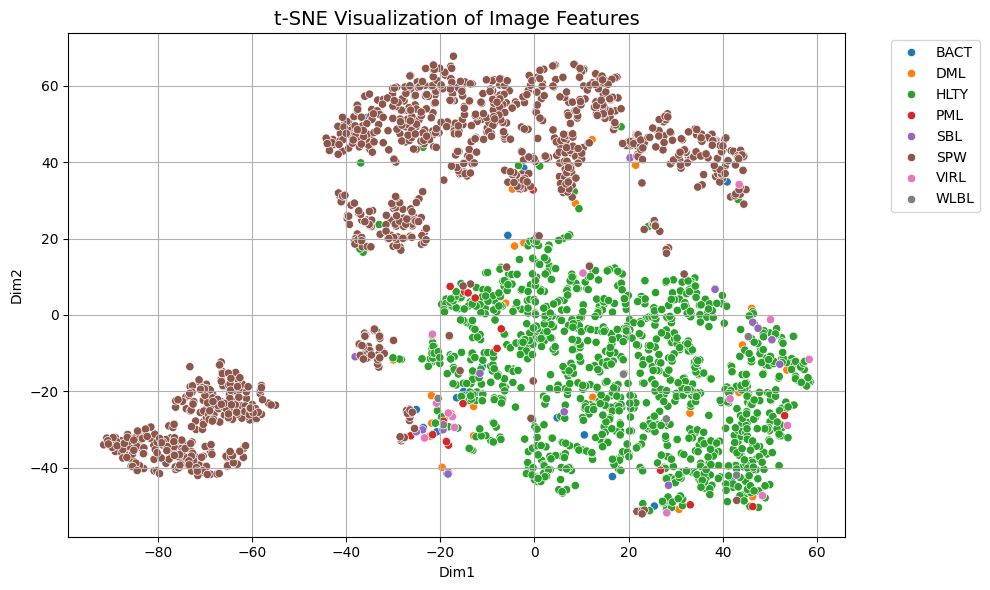

In [ ]:
from sklearn.manifold import TSNE

# t-SNE often benefits from PCA pre-processing
pca_50 = PCA(n_components=50)
X_pca_50 = pca_50.fit_transform(X_scaled)


tsne = TSNE(n_components=2, perplexity=30, max_iter=3000, random_state=42)
X_tsne = tsne.fit_transform(X_pca_50)


# Create DataFrame for plotting
df_tsne = pd.DataFrame(X_tsne, columns=["Dim1", "Dim2"])
df_tsne["class"] = df["class"]

# Plot t-SNE
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_tsne, x="Dim1", y="Dim2", hue="class", palette="tab10")
plt.title("t-SNE Visualization of Image Features", fontsize=14)
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

### The scatter plot shows the cluster of distinct classes based on their features :
    ### ----- t-SNE does well in clustering SPW class .
    ### But it fails to classify HLTY,VIRL,SBL and others.

# Save our feature Extracted data into csv/excel format.

In [ ]:
print(df.head(40))
df.shape

   class image_name  brightness  texture_0    texture_1  texture_2  \
0   BACT     BACT_0  105.681213   0.000213   179.414974   0.961457   
1   BACT     BACT_1  121.675126   0.000291   248.781522   0.852087   
2   BACT    BACT_10  121.750298   0.000424   599.545049   0.892747   
3   BACT    BACT_11  118.741499   0.000262   250.616348   0.954806   
4   BACT    BACT_12  109.830653   0.000250   219.855194   0.958645   
5   BACT    BACT_13  117.514634   0.000750   132.794858   0.939459   
6   BACT    BACT_14  109.830653   0.000250   219.855194   0.958645   
7   BACT    BACT_15  106.412073   0.000213   310.576730   0.925113   
8   BACT    BACT_16  134.547117   0.000185   209.239744   0.966586   
9   BACT    BACT_17  132.669919   0.000632   397.252706   0.936986   
10  BACT    BACT_18  125.333979   0.000168   215.940400   0.967427   
11  BACT    BACT_19   94.419968   0.000211   227.131611   0.921672   
12  BACT     BACT_2  103.128832   0.029585   214.526230   0.968576   
13  BACT     BACT_3 

(2336, 80)

In [ ]:
df.columns

Index(['class', 'image_name', 'brightness', 'texture_0', 'texture_1',
       'texture_2', 'texture_3', 'texture_4', 'texture_5', 'texture_6',
       'texture_7', 'texture_8', 'texture_9', 'texture_10', 'texture_11',
       'texture_12', 'hist_0', 'hist_1', 'hist_2', 'hist_3', 'hist_4',
       'hist_5', 'hist_6', 'hist_7', 'hist_8', 'hist_9', 'hist_10', 'hist_11',
       'hist_12', 'hist_13', 'hist_14', 'hist_15', 'hist_16', 'hist_17',
       'hist_18', 'hist_19', 'hist_20', 'hist_21', 'hist_22', 'hist_23',
       'hist_24', 'hist_25', 'hist_26', 'hist_27', 'hist_28', 'hist_29',
       'hist_30', 'hist_31', 'hist_32', 'hist_33', 'hist_34', 'hist_35',
       'hist_36', 'hist_37', 'hist_38', 'hist_39', 'hist_40', 'hist_41',
       'hist_42', 'hist_43', 'hist_44', 'hist_45', 'hist_46', 'hist_47',
       'hist_48', 'hist_49', 'hist_50', 'hist_51', 'hist_52', 'hist_53',
       'hist_54', 'hist_55', 'hist_56', 'hist_57', 'hist_58', 'hist_59',
       'hist_60', 'hist_61', 'hist_62', 'hist_63']

In [ ]:
df.to_csv("data/leaf_features.xlsx", index=False)